In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
train_csv_file_path = '/Users/laksha/Downloads/STA160/house-prices-advanced-regression-techniques/train.csv'

#loading original datasets
train_data = pd.read_csv(train_csv_file_path)
print(train_data.shape)

(1460, 81)
(1459, 80)


## Cleaning Original Dataset

#### Identifying features with string 'NA' values that are not missing value but rather meaning house has no pool/basement, etc.

In [2036]:
#getting all columns in a list
col_names_removing_valid_NAs = list(train_data.columns)
col_names_full = col_names_removing_valid_NAs
# list of columns that have NA as an actual value
col_with_valid_NAs = ['Alley', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 
'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']
print(f'num of cols with valid NAs: {len(col_with_valid_NAs)}')
#getting list of columns, excluding those that have NA as an actual value
for i in col_with_valid_NAs:
    col_names_removing_valid_NAs.remove(i)

len(col_names_removing_valid_NAs)
len(col_names_full)

num of cols with valid NAs: 14


67

In [2037]:
# re loading the train dataset to correctly interpret NA values as valid missing values in certain columns
na_dict = {col: ['NA'] for col in col_names_removing_valid_NAs}

train_csv_file_path = '/Users/laksha/Downloads/STA160/house-prices-advanced-regression-techniques/train.csv'

train_df = pd.read_csv(train_csv_file_path, na_values=na_dict, keep_default_na=False)
train_df = train_df.rename(columns={'BsmtQual': 'BsmtHeight'})
train_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtHeight,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NA,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NA,NA,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NA,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NA,NA,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0

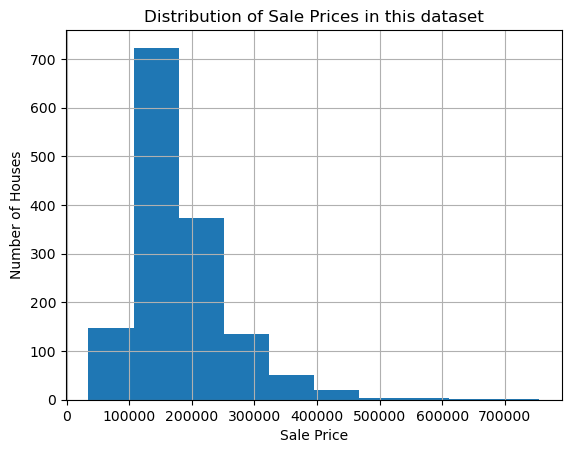

In [2040]:
#distribution of sale price
train_df['SalePrice'].hist()
plt.xlabel('Sale Price')
plt.ylabel('Number of Houses')
plt.title('Distribution of Sale Prices in this dataset')
plt.show()

In [2041]:
train_df['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

### Handling missing values by imputing median value for numerical features and mode for categorical features

In [2042]:
#Imputing median for missing values since mean would be biased to outliers
train_df['LotFrontage'] = train_df['LotFrontage'].fillna(train_df['LotFrontage'].median())

In [2043]:
#imputing mode value for missing value in categorical variable, Electrical
electrical_mode = train_df['Electrical'].mode()[0]
train_df['Electrical'].fillna(electrical_mode, inplace=True)

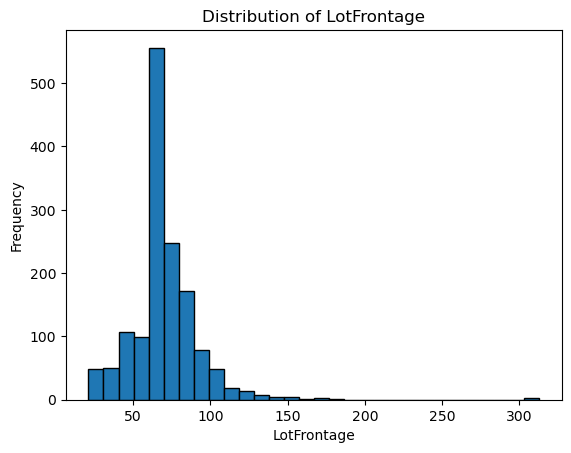

In [2044]:
# LotFrontage distribution after imputing medians
plt.hist(train_df['LotFrontage'].dropna(), bins=30, edgecolor='k')
plt.xlabel('LotFrontage')
plt.ylabel('Frequency')
plt.title('Distribution of LotFrontage')
plt.show()

### Correlation heatmap to visualize correlations between all features in original dataset

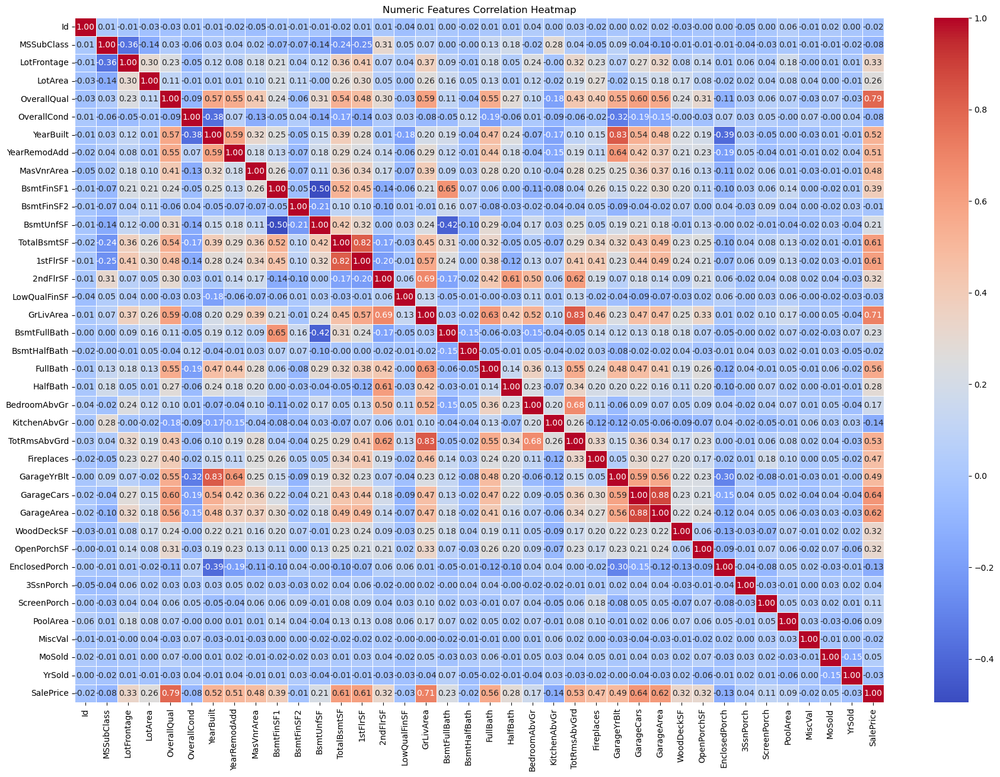

In [2045]:
y = train_df['SalePrice']
numeric_feats = train_df.select_dtypes(include=[np.number]).columns
corr_matrix_heatmap = train_df[numeric_feats].corr()

plt.figure(figsize=(22, 15))  # Adjust figure size as needed
sns.heatmap(corr_matrix_heatmap, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Numeric Features Correlation Heatmap')
plt.show()

### Removing features with over 50% NA values -- too many missing to provide predictive value

In [2046]:
#getting columns with over 50% with NA values (meaning no pool/basement/fireplace, etc) in training set
na_string_counts = (train_df == "NA").sum()
print(na_string_counts)

n_rows = len(train_df)

cols_over_50_na = na_string_counts[na_string_counts > 0.5 * n_rows].index.tolist()

print("Columns with >50% 'NA' strings:", cols_over_50_na)

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          0
MasVnrArea          0
ExterQual           0
ExterCond           0
Foundation          0
BsmtHeight         37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [2047]:
zero_val_counts = (train_df == 0).sum()
print(zero_val_counts)

cols_over_50_zero = zero_val_counts[zero_val_counts > 0.5 * n_rows].index.tolist()

print("Columns with >50% zero values:", cols_over_50_zero)

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley               0
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          0
MasVnrArea        861
ExterQual           0
ExterCond           0
Foundation          0
BsmtHeight          0
BsmtCond            0
BsmtExposure        0
BsmtFinType1        0
BsmtFinSF1        467
BsmtFinType2        0
BsmtFinSF2       1293
BsmtUnfSF         118
TotalBsmtSF        37
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF          829
LowQualFin

### Handling redundant features and multicollinearity - combining to create new features

In [2048]:
#new feature - porch type - open; enclosed; 3 season; screen; NA (no porch)
def get_porch_type(df_row):
    if df_row['OpenPorchSF'] > 0:
        return 'Open'
    elif df_row['EnclosedPorch'] > 0:
        return 'Enclosed'
    elif df_row['3SsnPorch'] > 0:
        return '3Season'
    elif df_row['ScreenPorch'] > 0:
        return 'Screen'
    else:
        return 'NA'
#getting porch type as new column
train_df['PorchType'] = train_df.apply(get_porch_type, axis=1)

#getting number of houses in dataset with each porch type
porch1_count = (train_df['PorchType'] == 'Open').sum()
print(porch1_count)
porch2_count = (train_df['PorchType'] == 'Enclosed').sum()
print(porch2_count)
porch3_count = (train_df['PorchType'] == '3Season').sum()
print(porch3_count)
porch4_count = (train_df['PorchType'] == 'Screen').sum()
print(porch4_count)
porch5_count = (train_df['PorchType'] == 'NA').sum()
print(porch5_count)

804
143
8
47
458


In [2050]:
#new feature - overall porch sq feet; regardless of type
train_df['PorchSqFt'] = train_df['OpenPorchSF'] + train_df['EnclosedPorch'] + train_df['3SsnPorch'] + train_df['ScreenPorch']
#getting number of houses in dataset with no porch based on having 0 sq ft
zero_porch_count = (train_df['PorchSqFt'] == 0).sum()
print(f" Number of houses in dataset with no porch: {zero_porch_count}")

 Number of houses in dataset with no porch: 458


In [2053]:
# combining features
# full bath + half bath + bsmt full and half baths = total num bathrooms
TotalNumBath_vals = train_df['FullBath'] + train_df['HalfBath']
TotalBsmtBaths_vals = train_df['BsmtFullBath'] + train_df['BsmtHalfBath']
train_df['TotalBathrooms'] = TotalNumBath_vals + TotalBsmtBaths_vals

In [2054]:
#new feature - total sq ft of all floors - combining 1st and 2nd florr sq feet
train_df['Flrs_1and2_SF'] = train_df['1stFlrSF'] + train_df['2ndFlrSF']

### Visualizing correlations of numerical features

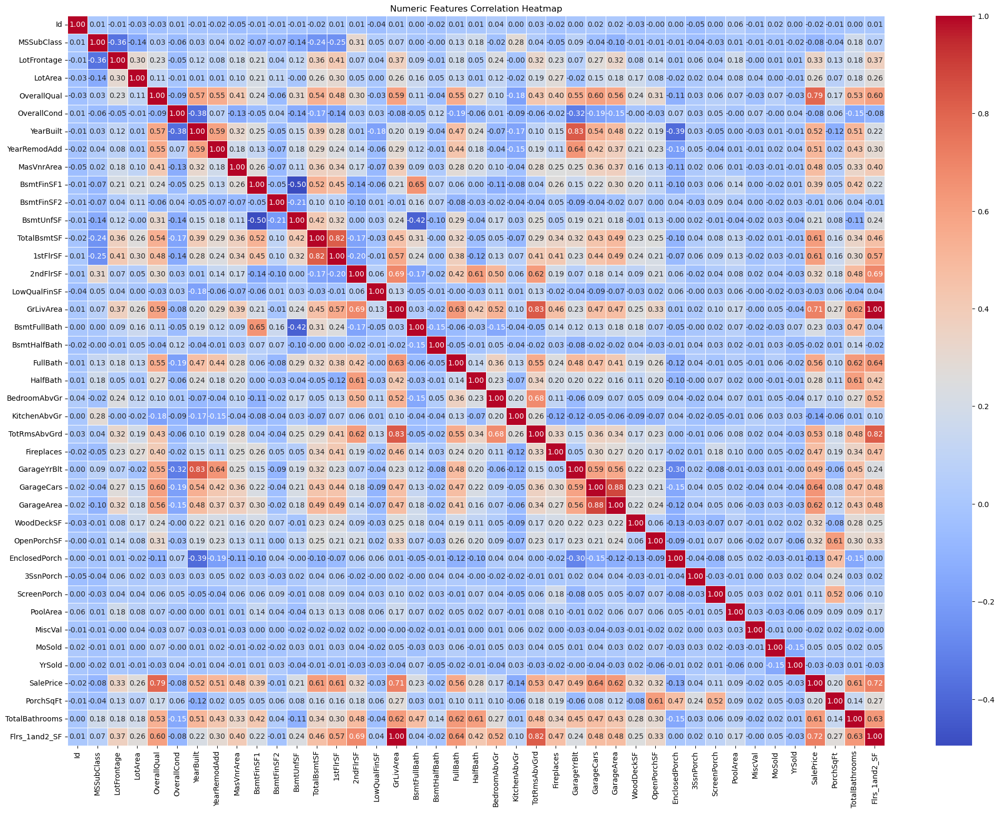

In [2056]:
numeric_feats = train_df.select_dtypes(include=[np.number]).columns
corr_matrix1 = train_df[numeric_feats].corr()
plt.figure(figsize=(25, 18))  
sns.heatmap(corr_matrix1, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Numeric Features Correlation Heatmap')
plt.show()

In [2096]:
train_df['MasVnrArea'] = train_df['MasVnrArea'].fillna(train_df['MasVnrArea'].median())

In [2147]:
#identifying categorical features with a dominant category that contains over 80% of data
dominance_threshold = 0.85  
over_80percent_dom_cats = []
for col in train_df.select_dtypes(include='object'):  # or include 'category' too
    top_freq = train_df[col].value_counts(normalize=True).max()
    if top_freq >= dominance_threshold:
        over_80percent_dom_cats.append(col)
        print(f"{col}: Dominant category frequency = {top_freq:.2%}")

Street: Dominant category frequency = 99.59%
Alley: Dominant category frequency = 93.77%
LandContour: Dominant category frequency = 89.79%
Utilities: Dominant category frequency = 99.93%
LandSlope: Dominant category frequency = 94.66%
Condition1: Dominant category frequency = 86.30%
Condition2: Dominant category frequency = 98.97%
RoofMatl: Dominant category frequency = 98.22%
ExterCond: Dominant category frequency = 87.81%
BsmtCond: Dominant category frequency = 89.79%
BsmtFinType2: Dominant category frequency = 86.03%
Heating: Dominant category frequency = 97.81%
CentralAir: Dominant category frequency = 93.49%
Electrical: Dominant category frequency = 91.44%
Functional: Dominant category frequency = 93.15%
GarageQual: Dominant category frequency = 89.79%
GarageCond: Dominant category frequency = 90.82%
PavedDrive: Dominant category frequency = 91.78%
PoolQC: Dominant category frequency = 99.52%
MiscFeature: Dominant category frequency = 96.30%
SaleType: Dominant category frequency =

### Dropping columns based on previous analysis (redundant features, missing values, dominant category)

In [2098]:
# DROPPING COLUMNS - missing too many values; redundant columns
# based on what is missing too many values to be a reasonable predictor; redundancy and multicollinearity
bath_col_to_remove = ['FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath']
cols_NA_to_remove = ['MiscVal', 'PoolArea', 'LowQualFinSF', 'FireplaceQu', 'WoodDeckSF', 'MasVnrType']
redundants_to_remove = ['YearBuilt', 'Neighborhood', 'OverallQual', 'TotRmsAbvGrd', 'GarageYrBlt', 
                        'GarageArea', 'BsmtUnfSF', 'BsmtFinSF1', 'BsmtFinSF2', 'OpenPorchSF', 'GrLivArea', 
                        'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'OverallCond', 
                        '1stFlrSF', '2ndFlrSF', 'Exterior1st', 'Exterior2nd', 
                        'MSSubClass', 'KitchenAbvGr']
# removing features that have too many missing values or redundant
train_df_clean = train_df.drop(bath_col_to_remove, axis=1)
#dropping categorical columns with one dominant category - 80% of houses are in that category
train_df_clean = train_df_clean.drop(over_80percent_dom_cats, axis=1)
train_df_clean = train_df_clean.drop(cols_NA_to_remove, axis=1)
train_df_clean = train_df_clean.drop(redundants_to_remove, axis=1)
train_df_clean.head(10)

,Id,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,HouseStyle,YearRemodAdd,RoofStyle,MasVnrArea,ExterQual,Foundation,BsmtHeight,BsmtExposure,BsmtFinType1,TotalBsmtSF,HeatingQC,BedroomAbvGr,KitchenQual,Fireplaces,GarageType,GarageFinish,GarageCars,MoSold,YrSold,SalePrice,PorchType,PorchSqFt,TotalBathrooms,Flrs_1and2_SF
0,1,RL,65.0,8450,Reg,Inside,2Story,2003,Gable,196.0,Gd,PConc,Gd,No,GLQ,856,Ex,3,Gd,0,Attchd,RFn,2,2,2008,208500,Open,61,4,1710
1,2,RL,80.0,9600,Reg,FR2,1Story,1976,Gable,0.0,TA,CBlock,Gd,Gd,ALQ,1262,Ex,3,TA,1,Attchd,RFn,2,5,2007,181500,NA,0,3,1262
2,3,RL,68.0,11250,IR1,Inside,2Story,2002,Gable,162.0,Gd,PConc,Gd,Mn,GLQ,920,Ex,3,Gd,1,Attchd,RFn,2,9,2008,223500,Open,42,4,1786
3,4,RL,60.0,9550,IR1,Corner,2Story,1970,Gable,0.0,TA,BrkTil,TA,No,ALQ,756,Gd,3,Gd,1,Detchd,Unf,3,2,2006,140000,Open,307,2,1717
4,5,RL,84.0,14260,IR1,FR2,2Story,2000,Gable,350.0,Gd,PConc,Gd,Av,GLQ,1145,Ex,4,Gd,1,Attchd,RFn,3,12,2008,250000,Open,84,4,2198
5,6,RL,85.0,14115,IR1,Inside,1.5Fin,1995,Gable,0.0,TA,Wood,Gd,No,GLQ,796,Ex,1,TA,0,Attchd,Unf,2,10,2009,143000,Open,350,3,1362
6,7,RL,75.0,10084,Reg,Inside,1Story,2005,Gable,186.0,Gd,PConc,Ex,Av,GLQ,1686,Ex,3,Gd,1,Attchd,RFn,2,8,2007,307000,Open,57,3,1694
7,8,RL,69.0,10382,IR1,Corner,2Story,1973,Gable,240.0,TA,CBlock,Gd,Mn,ALQ,1107,Ex,3,TA,2,Attchd,RFn,2,11,2009,200000,Open,432,4,2090
8,9,RM,51.0,6120,Reg,Inside,1.5Fin,1950,Gable,0.0,TA,BrkTil,TA,No,Unf,952,Gd,2,TA,2,Detchd,Unf,2,4,2008,129900,Enclosed,205,2,1774
9,10,RL,50.0,7420,Reg,Corner,1.5Unf,1950,Gable,0.0,TA,BrkTil,TA,No,GLQ,991,Ex,2,TA,2,Attchd,RFn,1,1,2008,118000,Open,4,2,1077


In [2099]:
train_df_clean.shape

(1460, 30)

### Correlation heatmap of numerical features after dropping features

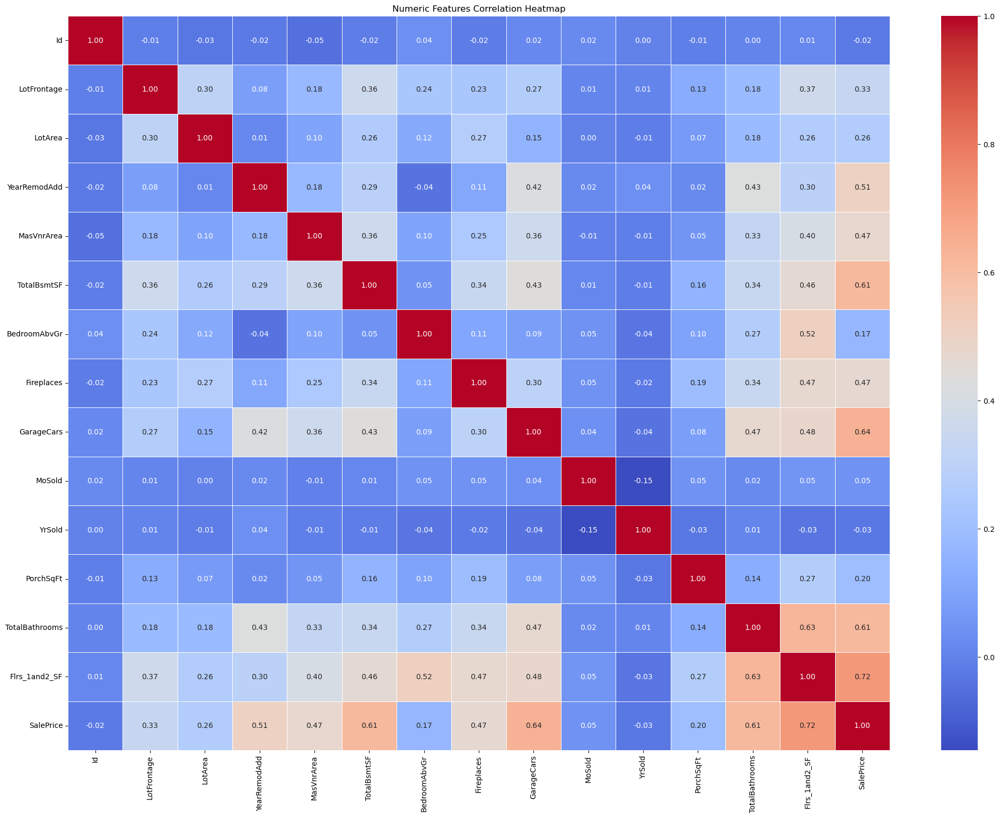

In [2100]:
#fixing position of Sale Price column for readability, so that it is at the end
saved_SalePrice = train_df_clean['SalePrice']
train_df_clean = train_df_clean.drop('SalePrice', axis=1)
train_df_clean['SalePrice'] = saved_SalePrice
#correlation matrix of numerical features after cleaning
numeric_feats = train_df_clean.select_dtypes(include=[np.number]).columns
corr_matrix_clean = train_df_clean[numeric_feats].corr()
plt.figure(figsize=(25, 18)) 
sns.heatmap(corr_matrix_clean, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Numeric Features Correlation Heatmap')
plt.show()

### Data Cleaning - Handling Categorical Variables

In [2102]:
cat_columns = train_df_clean.select_dtypes(include='object').columns.tolist()
print("Object Columns:", cat_columns)

Object Columns: ['MSZoning', 'LotShape', 'LotConfig', 'HouseStyle', 'RoofStyle', 'ExterQual', 'Foundation', 'BsmtHeight', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'GarageType', 'GarageFinish', 'PorchType']


In [2105]:
#converting categorical variables to ordinal: ExterQual; ExterCond; BsmtQual; BsmtCond; 
overall_qual_map = {
    'Po': 1,
    'Fa': 2,
    'TA': 3,
    'Gd': 4,
    'Ex': 5
}

bsmt_qual_map = {
    'NA': 1,
    'Po': 2,
    'Fa': 3,
    'TA': 4,
    'Gd': 5,
    'Ex': 6
}
bsmtExposure_qual_map = {
    'NA': 1,
    'No': 2,
    'Mn': 3,
    'Av': 4,
    'Gd': 5
}


train_df_clean['ExterQual'] = train_df_clean['ExterQual'].map(overall_qual_map)
train_df_clean['HeatingQC'] = train_df_clean['HeatingQC'].map(overall_qual_map)
train_df_clean['KitchenQual'] = train_df_clean['KitchenQual'].map(overall_qual_map)
train_df_clean['BsmtHeight'] = train_df_clean['BsmtHeight'].map(bsmt_qual_map)
train_df_clean['BsmtExposure'] = train_df_clean['BsmtExposure'].map(bsmtExposure_qual_map)


train_df_clean.head(10)

,Id,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,HouseStyle,YearRemodAdd,RoofStyle,MasVnrArea,ExterQual,Foundation,BsmtHeight,BsmtExposure,BsmtFinType1,TotalBsmtSF,HeatingQC,BedroomAbvGr,KitchenQual,Fireplaces,GarageType,GarageFinish,GarageCars,MoSold,YrSold,PorchType,PorchSqFt,TotalBathrooms,Flrs_1and2_SF,SalePrice
0,1,RL,65.0,8450,Reg,Inside,2Story,2003,Gable,196.0,4,PConc,5,2,GLQ,856,5,3,4,0,Attchd,RFn,2,2,2008,Open,61,4,1710,208500
1,2,RL,80.0,9600,Reg,FR2,1Story,1976,Gable,0.0,3,CBlock,5,5,ALQ,1262,5,3,3,1,Attchd,RFn,2,5,2007,NA,0,3,1262,181500
2,3,RL,68.0,11250,IR1,Inside,2Story,2002,Gable,162.0,4,PConc,5,3,GLQ,920,5,3,4,1,Attchd,RFn,2,9,2008,Open,42,4,1786,223500
3,4,RL,60.0,9550,IR1,Corner,2Story,1970,Gable,0.0,3,BrkTil,4,2,ALQ,756,4,3,4,1,Detchd,Unf,3,2,2006,Open,307,2,1717,140000
4,5,RL,84.0,14260,IR1,FR2,2Story,2000,Gable,350.0,4,PConc,5,4,GLQ,1145,5,4,4,1,Attchd,RFn,3,12,2008,Open,84,4,2198,250000
5,6,RL,85.0,14115,IR1,Inside,1.5Fin,1995,Gable,0.0,3,Wood,5,2,GLQ,796,5,1,3,0,Attchd,Unf,2,10,2009,Open,350,3,1362,143000
6,7,RL,75.0,10084,Reg,Inside,1Story,2005,Gable,186.0,4,PConc,6,4,GLQ,1686,5,3,4,1,Attchd,RFn,2,8,2007,Open,57,3,1694,307000
7,8,RL,69.0,10382,IR1,Corner,2Story,1973,Gable,240.0,3,CBlock,5,3,ALQ,1107,5,3,3,2,Attchd,RFn,2,11,2009,Open,432,4,2090,200000
8,9,RM,51.0,6120,Reg,Inside,1.5Fin,1950,Gable,0.0,3,BrkTil,4,2,Unf,952,4,2,3,2,Detchd,Unf,2,4,2008,Enclosed,205,2,1774,129900
9,10,RL,50.0,7420,Reg,Corner,1.5Unf,1950,Gable,0.0,3,BrkTil,4,2,GLQ,991,5,2,3,2,Attchd,RFn,1,1,2008,Open,4,2,1077,118000


In [2106]:
#imputing median for BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, KitchenQual, GarageCars
test_df['BsmtUnfSF'] = test_df['BsmtUnfSF'].fillna(test_df['BsmtUnfSF'].median())
test_df['TotalBsmtSF'] = test_df['TotalBsmtSF'].fillna(test_df['TotalBsmtSF'].median())
test_df['GarageCars'] = test_df['GarageCars'].fillna(test_df['GarageCars'].median())
test_df['TotalBathrooms'] = test_df['TotalBathrooms'].fillna(test_df['TotalBathrooms'].median())

#imputing mode for MS Zoning; Exterior1st and 2nd; SaleType; Functional
#MS Zoning
msZoning_mode = test_df['MSZoning'].mode()[0]
test_df['MSZoning'].fillna(msZoning_mode, inplace=True)
#KitchenQual
kitchenQual_mode = test_df['KitchenQual'].mode()[0]
test_df['KitchenQual'].fillna(kitchenQual_mode, inplace=True)
#Functional
functional_mode = test_df['Functional'].mode()[0]
test_df['Functional'].fillna(functional_mode, inplace=True)
#Ext 1st
Ext1_mode = test_df['Exterior1st'].mode()[0]
test_df['Exterior1st'].fillna(Ext1_mode, inplace=True)
#Ext 2nd
Ext2_mode = test_df['Exterior2nd'].mode()[0]
test_df['Exterior2nd'].fillna(Ext2_mode, inplace=True)
#sale type
SaleType_mode = test_df['SaleType'].mode()[0]
test_df['SaleType'].fillna(SaleType_mode, inplace=True)


In [2107]:
#drop features that are redundant in relation to SalePrice as found through tests and correlations in training set
test_df_clean = test_df.drop(bath_col_to_remove, axis=1)
test_df_clean = test_df_clean.drop(cols_NA_to_remove, axis=1)
test_df_clean = test_df_clean.drop(redundants_to_remove, axis=1)
test_df_clean = test_df_clean.drop(insignificant_cat_cols, axis=1)
 
test_df_clean.head(10)

,Id,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Condition1,Condition2,BldgType,HouseStyle,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,BedroomAbvGr,KitchenQual,Functional,Fireplaces,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,PorchType,PorchSqFt,TotalBathrooms,Flrs_1and2_SF
0,1461,RH,80.0,11622,NA,Reg,Lvl,Inside,Feedr,Norm,1Fam,1Story,1961,Gable,CompShg,0.0,TA,TA,CBlock,TA,TA,No,Rec,LwQ,882.0,GasA,TA,Y,SBrkr,2,TA,Typ,0,Attchd,Unf,1.0,TA,TA,Y,NA,MnPrv,NA,6,2010,WD,Normal,Screen,120,1.0,896
1,1462,RL,81.0,14267,NA,IR1,Lvl,Corner,Norm,Norm,1Fam,1Story,1958,Hip,CompShg,108.0,TA,TA,CBlock,TA,TA,No,ALQ,Unf,1329.0,GasA,TA,Y,SBrkr,3,Gd,Typ,0,Attchd,Unf,1.0,TA,TA,Y,NA,NA,Gar2,6,2010,WD,Normal,Open,36,2.0,1329
2,1463,RL,74.0,13830,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,2Story,1998,Gable,CompShg,0.0,TA,TA,PConc,Gd,TA,No,GLQ,Unf,928.0,GasA,Gd,Y,SBrkr,3,TA,Typ,1,Attchd,Fin,2.0,TA,TA,Y,NA,MnPrv,NA,3,2010,WD,Normal,Open,34,3.0,1629
3,1464,RL,78.0,9978,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,2Story,1998,Gable,CompShg,20.0,TA,TA,PConc,TA,TA,No,GLQ,Unf,926.0,GasA,Ex,Y,SBrkr,3,Gd,Typ,1,Attchd,Fin,2.0,TA,TA,Y,NA,NA,NA,6,2010,WD,Normal,Open,36,3.0,1604
4,1465,RL,43.0,5005,NA,IR1,HLS,Inside,Norm,Norm,TwnhsE,1Story,1992,Gable,CompShg,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,Unf,1280.0,GasA,Ex,Y,SBrkr,2,Gd,Typ,0,Attchd,RFn,2.0,TA,TA,Y,NA,NA,NA,1,2010,WD,Normal,Open,226,2.0,1280
5,1466,RL,75.0,10000,NA,IR1,Lvl,Corner,Norm,Norm,1Fam,2Story,1994,Gable,CompShg,0.0,TA,TA,PConc,Gd,TA,No,Unf,Unf,763.0,GasA,Gd,Y,SBrkr,3,TA,Typ,1,Attchd,Fin,2.0,TA,TA,Y,NA,NA,NA,4,2010,WD,Normal,Open,84,3.0,1655
6,1467,RL,67.0,7980,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,1Story,2007,Gable,CompShg,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,Unf,1168.0,GasA,Ex,Y,SBrkr,3,TA,Typ,0,Attchd,Fin,2.0,TA,TA,Y,NA,GdPrv,Shed,3,2010,WD,Normal,Open,21,3.0,1187
7,1468,RL,63.0,8402,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,2Story,1998,Gable,CompShg,0.0,TA,TA,PConc,Gd,TA,No,Unf,Unf,789.0,GasA,Gd,Y,SBrkr,3,TA,Typ,1,Attchd,Fin,2.0,TA,TA,Y,NA,NA,NA,5,2010,WD,Normal,Open,75,3.0,1465
8,1469,RL,85.0,10176,NA,Reg,Lvl,Inside,Norm,Norm,1Fam,1Story,1990,Gable,CompShg,0.0,TA,TA,PConc,Gd,TA,Gd,GLQ,Unf,1300.0,GasA,Gd,Y,SBrkr,2,Gd,Typ,1,Attchd,Unf,2.0,TA,TA,Y,NA,NA,NA,2,2010,WD,Normal,NA,0,3.0,1341
9,1470,RL,70.0,8400,NA,Reg,Lvl,Corner,Norm,Norm,1Fam,1Story,1970,Gable,CompShg,0.0,TA,TA,CBlock,TA,TA,No,ALQ,Rec,882.0,GasA,TA,Y,SBrkr,2,TA,Typ,0,Attchd,Fin,2.0,TA,TA,Y,NA,MnPrv,NA,4,2010,WD,Normal,NA,0,2.0,882


In [2108]:
#ordinal variables
test_df_clean['ExterQual'] = test_df_clean['ExterQual'].map(overall_qual_map)
test_df_clean['ExterCond'] = test_df_clean['ExterCond'].map(overall_qual_map)
test_df_clean['HeatingQC'] = test_df_clean['HeatingQC'].map(overall_qual_map)
test_df_clean['KitchenQual'] = test_df_clean['KitchenQual'].map(overall_qual_map)
test_df_clean['BsmtQual'] = test_df_clean['BsmtQual'].map(bsmt_qual_map)
test_df_clean['BsmtCond'] = test_df_clean['BsmtCond'].map(bsmt_qual_map)
test_df_clean['GarageQual'] = test_df_clean['GarageQual'].map(bsmt_qual_map)
test_df_clean['GarageCond'] = test_df_clean['GarageCond'].map(bsmt_qual_map)
test_df_clean['BsmtExposure'] = test_df_clean['BsmtExposure'].map(bsmtExposure_qual_map)
test_df_clean.head(10)

,Id,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Condition1,Condition2,BldgType,HouseStyle,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,BedroomAbvGr,KitchenQual,Functional,Fireplaces,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,PorchType,PorchSqFt,TotalBathrooms,Flrs_1and2_SF
0,1461,RH,80.0,11622,NA,Reg,Lvl,Inside,Feedr,Norm,1Fam,1Story,1961,Gable,CompShg,0.0,3,3,CBlock,4,4,2,Rec,LwQ,882.0,GasA,3,Y,SBrkr,2,3,Typ,0,Attchd,Unf,1.0,4,4,Y,NA,MnPrv,NA,6,2010,WD,Normal,Screen,120,1.0,896
1,1462,RL,81.0,14267,NA,IR1,Lvl,Corner,Norm,Norm,1Fam,1Story,1958,Hip,CompShg,108.0,3,3,CBlock,4,4,2,ALQ,Unf,1329.0,GasA,3,Y,SBrkr,3,4,Typ,0,Attchd,Unf,1.0,4,4,Y,NA,NA,Gar2,6,2010,WD,Normal,Open,36,2.0,1329
2,1463,RL,74.0,13830,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,2Story,1998,Gable,CompShg,0.0,3,3,PConc,5,4,2,GLQ,Unf,928.0,GasA,4,Y,SBrkr,3,3,Typ,1,Attchd,Fin,2.0,4,4,Y,NA,MnPrv,NA,3,2010,WD,Normal,Open,34,3.0,1629
3,1464,RL,78.0,9978,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,2Story,1998,Gable,CompShg,20.0,3,3,PConc,4,4,2,GLQ,Unf,926.0,GasA,5,Y,SBrkr,3,4,Typ,1,Attchd,Fin,2.0,4,4,Y,NA,NA,NA,6,2010,WD,Normal,Open,36,3.0,1604
4,1465,RL,43.0,5005,NA,IR1,HLS,Inside,Norm,Norm,TwnhsE,1Story,1992,Gable,CompShg,0.0,4,3,PConc,5,4,2,ALQ,Unf,1280.0,GasA,5,Y,SBrkr,2,4,Typ,0,Attchd,RFn,2.0,4,4,Y,NA,NA,NA,1,2010,WD,Normal,Open,226,2.0,1280
5,1466,RL,75.0,10000,NA,IR1,Lvl,Corner,Norm,Norm,1Fam,2Story,1994,Gable,CompShg,0.0,3,3,PConc,5,4,2,Unf,Unf,763.0,GasA,4,Y,SBrkr,3,3,Typ,1,Attchd,Fin,2.0,4,4,Y,NA,NA,NA,4,2010,WD,Normal,Open,84,3.0,1655
6,1467,RL,67.0,7980,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,1Story,2007,Gable,CompShg,0.0,3,4,PConc,5,4,2,ALQ,Unf,1168.0,GasA,5,Y,SBrkr,3,3,Typ,0,Attchd,Fin,2.0,4,4,Y,NA,GdPrv,Shed,3,2010,WD,Normal,Open,21,3.0,1187
7,1468,RL,63.0,8402,NA,IR1,Lvl,Inside,Norm,Norm,1Fam,2Story,1998,Gable,CompShg,0.0,3,3,PConc,5,4,2,Unf,Unf,789.0,GasA,4,Y,SBrkr,3,3,Typ,1,Attchd,Fin,2.0,4,4,Y,NA,NA,NA,5,2010,WD,Normal,Open,75,3.0,1465
8,1469,RL,85.0,10176,NA,Reg,Lvl,Inside,Norm,Norm,1Fam,1Story,1990,Gable,CompShg,0.0,3,3,PConc,5,4,5,GLQ,Unf,1300.0,GasA,4,Y,SBrkr,2,4,Typ,1,Attchd,Unf,2.0,4,4,Y,NA,NA,NA,2,2010,WD,Normal,NA,0,3.0,1341
9,1470,RL,70.0,8400,NA,Reg,Lvl,Corner,Norm,Norm,1Fam,1Story,1970,Gable,CompShg,0.0,3,3,CBlock,4,4,2,ALQ,Rec,882.0,GasA,3,Y,SBrkr,2,3,Typ,0,Attchd,Fin,2.0,4,4,Y,NA,MnPrv,NA,4,2010,WD,Normal,NA,0,2.0,882


### One-hot encoding categorical variables such that each category becomes a binary variable (0 or 1)
#### Creates numerical format that is suitable for predictive modeling and getting pearson correlations to further assess correlations between features

In [2109]:
cat_cols_final = train_df_clean.select_dtypes(include='object').columns
cat_cols_df = train_df_clean[cat_cols_final]
cat_cols_encoded = pd.get_dummies(cat_cols_df, dtype=int)
cat_cols_encoded.head(10)

,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_Fin,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,PorchType_3Season,PorchType_Enclosed,PorchType_NA,PorchType_Open,PorchType_Screen
0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
4,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
5,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
6,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
7,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
8,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0
9,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0


### Correlation heatmap visualizing correlations between categorical variables after one-hot encoding

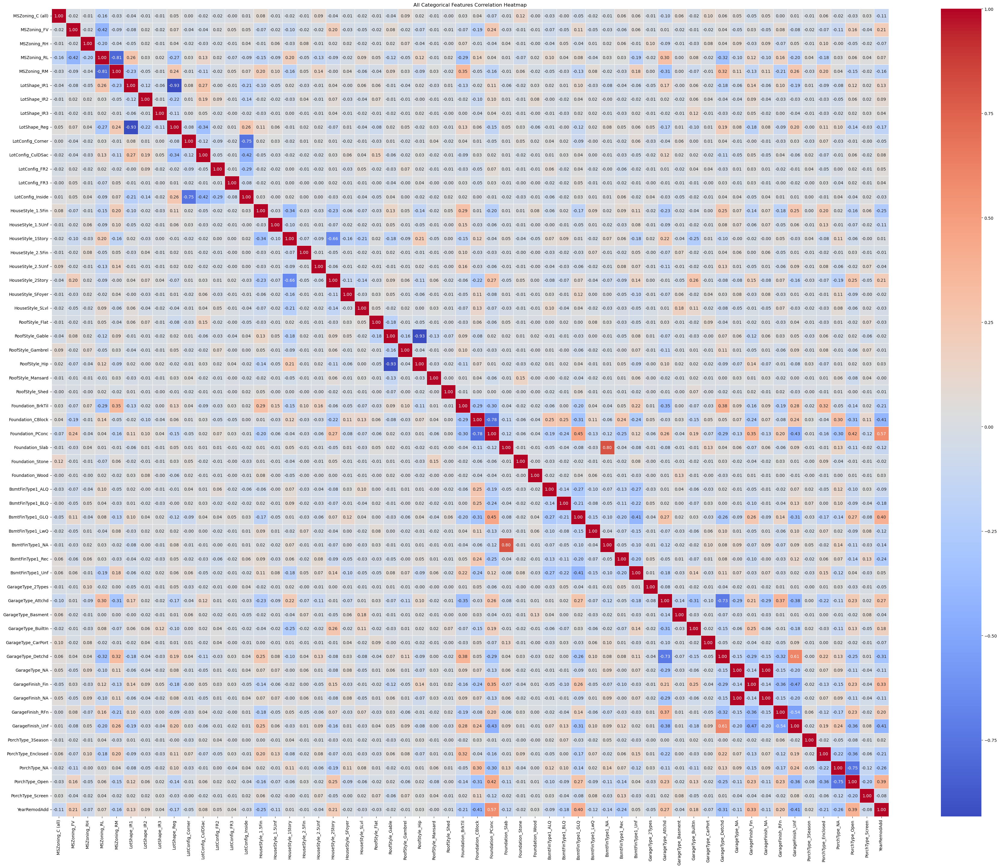

In [2110]:
cat_cols_encoded['YearRemodAdd'] = train_df_clean['YearRemodAdd']
cat_cols_corr_matrix = cat_cols_encoded.corr()
plt.figure(figsize=(45, 35)) 
sns.heatmap(cat_cols_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('All Categorical Features Correlation Heatmap')
plt.show()

In [2111]:
from sklearn.preprocessing import OneHotEncoder
train_df_encoded = pd.get_dummies(train_df_clean, columns=cat_cols_final, dtype=int)
train_df_encoded.head(10)

,Id,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,ExterQual,BsmtHeight,BsmtExposure,TotalBsmtSF,HeatingQC,BedroomAbvGr,KitchenQual,Fireplaces,GarageCars,MoSold,YrSold,PorchSqFt,TotalBathrooms,Flrs_1and2_SF,SalePrice,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_Fin,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,PorchType_3Season,PorchType_Enclosed,PorchType_NA,PorchType_Open,PorchType_Screen
0,1,65.0,8450,2003,196.0,4,5,2,856,5,3,4,0,2,2,2008,61,4,1710,208500,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,2,80.0,9600,1976,0.0,3,5,5,1262,5,3,3,1,2,5,2007,0,3,1262,181500,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,3,68.0,11250,2002,162.0,4,5,3,920,5,3,4,1,2,9,2008,42,4,1786,223500,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,4,60.0,9550,1970,0.0,3,4,2,756,4,3,4,1,3,2,2006,307,2,1717,140000,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
4,5,84.0,14260,2000,350.0,4,5,4,1145,5,4,4,1,3,12,2008,84,4,2198,250000,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
5,6,85.0,14115,1995,0.0,3,5,2,796,5,1,3,0,2,10,2009,350,3,1362,143000,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
6,7,75.0,10084,2005,186.0,4,6,4,1686,5,3,4,1,2,8,2007,57,3,1694,307000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
7,8,69.0,10382,1973,240.0,3,5,3,1107,5,3,3,2,2,11,2009,432,4,2090,200000,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
8,9,51.0,6120,1950,0.0,3,4,2,952,4,2,3,2,2,4,2008,205,2,1774,129900,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0
9,10,50.0,7420,1950,0.0,3,4,2,991,5,2,3,2,1,1,2008,4,2,1077,118000,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [2112]:
train_df_encoded.shape

(1460, 77)

In [2132]:
all_cols_corr_matrix = train_df_encoded.corr()
all_cols_corr_matrix = train_df_encoded.corr()['SalePrice'].abs().sort_values(ascending=False)
print("Top 10 correlations with SalePrice:\n", all_cols_corr_matrix)

Top 10 correlations with SalePrice:
 SalePrice             1.000000
Flrs_1and2_SF         0.716883
ExterQual             0.682639
KitchenQual           0.659600
GarageCars            0.640409
TotalBsmtSF           0.613581
TotalBathrooms        0.613005
BsmtHeight            0.585207
YearRemodAdd          0.507101
Foundation_PConc      0.497734
MasVnrArea            0.472614
Fireplaces            0.466929
BsmtFinType1_GLQ      0.434597
HeatingQC             0.427649
GarageFinish_Fin      0.419678
PorchType_Open        0.412959
GarageFinish_Unf      0.410608
BsmtExposure          0.374696
GarageType_Detchd     0.354141
Foundation_CBlock     0.343263
GarageType_Attchd     0.335961
LotFrontage           0.334771
PorchType_NA          0.296678
MSZoning_RM           0.288065
LotShape_Reg          0.267672
LotArea               0.263843
MSZoning_RL           0.245063
HouseStyle_2Story     0.242880
GarageType_NA         0.236832
GarageFinish_NA       0.236832
RoofStyle_Hip         0.235897
Ga

In [2113]:
#ensuring all numerical variables are int data type 
train_df_clean['LotFrontage'] = train_df_clean['LotFrontage'].astype(int)

test_float_cols = test_df_clean.select_dtypes(include=['float64', 'float32']).columns

# Convert to integer and handle NaN values
test_df_clean[test_float_cols] = test_df_clean[test_float_cols].astype('Int64')

#removing Id column
train_df_clean = train_df_clean.drop('Id', axis=1)
train_df_encoded = train_df_encoded.drop('Id', axis=1)
test_df_clean = test_df_clean.drop('Id', axis=1)

In [2114]:
#creating X dataset excluding target variable
train_df_encoded.head(10)
X_encoded = train_df_encoded.drop('SalePrice', axis=1)

print(X_encoded.shape)

(1460, 75)


In [2115]:
#final top correlations with numeric features after fixing ordinal variables
numeric_feats = train_df_clean.select_dtypes(include=[np.number]).columns
corr_matrix_num = train_df_clean[numeric_feats].corr()
top_corr_num = corr_matrix_num['SalePrice'].abs().sort_values(ascending=False)
print("Top 10 numeric correlations with SalePrice:\n", top_corr_num)

Top 10 numeric correlations with SalePrice:
 SalePrice         1.000000
Flrs_1and2_SF     0.716883
ExterQual         0.682639
KitchenQual       0.659600
GarageCars        0.640409
TotalBsmtSF       0.613581
TotalBathrooms    0.613005
BsmtHeight        0.585207
YearRemodAdd      0.507101
MasVnrArea        0.472614
Fireplaces        0.466929
HeatingQC         0.427649
BsmtExposure      0.374696
LotFrontage       0.334771
LotArea           0.263843
PorchSqFt         0.195739
BedroomAbvGr      0.168213
MoSold            0.046432
YrSold            0.028923
Name: SalePrice, dtype: float64


In [2116]:
#numeric feats correlations with YearRemodel
numeric_feats = train_df_clean.select_dtypes(include=[np.number]).columns
corr_matrix_num = train_df_clean[numeric_feats].corr()
top_corr_num = corr_matrix_num['YearRemodAdd'].abs().sort_values(ascending=False)
print("Top 10 numeric correlations with YearRemodAdd:\n", top_corr_num)

Top 10 numeric correlations with YearRemodAdd:
 YearRemodAdd      1.000000
KitchenQual       0.625316
ExterQual         0.587318
HeatingQC         0.550017
BsmtHeight        0.515013
SalePrice         0.507101
TotalBathrooms    0.426079
GarageCars        0.420622
Flrs_1and2_SF     0.295593
TotalBsmtSF       0.291066
BsmtExposure      0.221405
MasVnrArea        0.176529
Fireplaces        0.112581
LotFrontage       0.083348
BedroomAbvGr      0.040581
YrSold            0.035743
PorchSqFt         0.021951
MoSold            0.021490
LotArea           0.013788
Name: YearRemodAdd, dtype: float64


In [2179]:
print(X_encoded.shape)

(1460, 75)


In [2118]:
X_encoded = X_encoded.rename(columns={'BsmtQual': 'BsmtHeight'})

['LotFrontage',
 'LotArea',
 'YearRemodAdd',
 'MasVnrArea',
 'ExterQual',
 'BsmtHeight',
 'BsmtExposure',
 'TotalBsmtSF',
 'HeatingQC',
 'BedroomAbvGr',
 'KitchenQual',
 'Fireplaces',
 'GarageCars',
 'MoSold',
 'YrSold',
 'PorchSqFt',
 'TotalBathrooms',
 'Flrs_1and2_SF',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'LotShape_IR1',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'HouseStyle_1.5Fin',
 'HouseStyle_1.5Unf',
 'HouseStyle_1Story',
 'HouseStyle_2.5Fin',
 'HouseStyle_2.5Unf',
 'HouseStyle_2Story',
 'HouseStyle_SFoyer',
 'HouseStyle_SLvl',
 'RoofStyle_Flat',
 'RoofStyle_Gable',
 'RoofStyle_Gambrel',
 'RoofStyle_Hip',
 'RoofStyle_Mansard',
 'RoofStyle_Shed',
 'Foundation_BrkTil',
 'Foundation_CBlock',
 'Foundation_PConc',
 'Foundation_Slab',
 'Foundation_Stone',
 'Foundation_Wood',
 'BsmtFinType1_ALQ',
 'BsmtFinType1_BLQ',
 'BsmtFinType

### Grouping features as interior or structural features

In [2137]:
interior_fts = ['BsmtExposure', 'TotalBsmtSF', 'HeatingQC', 'BedroomAbvGr', 'KitchenQual',
               'Fireplaces', 'GarageCars', 'PorchSqFt', 'TotalBathrooms', 'Flrs_1and2_SF', 'GarageType_2Types',
 'GarageType_Attchd',
 'GarageType_Basment',
 'GarageType_BuiltIn',
 'GarageType_CarPort',
 'GarageType_Detchd',
 'GarageType_NA','PorchType_3Season',
 'PorchType_Enclosed',
 'PorchType_NA',
 'PorchType_Open',
 'PorchType_Screen',  'BsmtFinType1_ALQ',
 'BsmtFinType1_BLQ',
 'BsmtFinType1_GLQ',
 'BsmtFinType1_LwQ',
 'BsmtFinType1_NA',
 'BsmtFinType1_Rec',
 'BsmtFinType1_Unf','BsmtHeight']

structural_fts = ['LotFrontage', 'LotArea', 'YearRemodAdd', 'ExterQual',
 'LotShape_IR1',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'HouseStyle_1.5Fin',
 'HouseStyle_1.5Unf',
 'HouseStyle_1Story',
 'HouseStyle_2.5Fin',
 'HouseStyle_2.5Unf',
 'HouseStyle_2Story',
 'HouseStyle_SFoyer',
 'HouseStyle_SLvl',
 'RoofStyle_Flat',
 'RoofStyle_Gable',
 'RoofStyle_Gambrel',
 'RoofStyle_Hip',
 'RoofStyle_Mansard',
 'RoofStyle_Shed',
 'Foundation_BrkTil',
 'Foundation_CBlock',
 'Foundation_PConc',
 'Foundation_Slab',
 'Foundation_Stone',
 'Foundation_Wood',
'GarageFinish_Fin',
 'GarageFinish_NA',
 'GarageFinish_RFn',
 'GarageFinish_Unf', 'MasVnrArea']

print(len(interior_fts))
print(len(structural_fts))

30
38


## Model Predictions and Evaluation -- Logistic/Lasso/Ridge Regression, Linear Regression, Random Forest, XGBoost

In [2170]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

lr_importances = []
rf_importances = []
xgb_importances = []
lasso_importances = []
ridge_importances = []
rmse_scores_lr = []
rmse_scores_rf = []
rmse_scores_xgb = []
rmse_scores_lasso = []
rmse_scores_ridge = []
mse_scores_lr = []
mse_scores_rf = []
mse_scores_xgb = []
mse_scores_lasso = []
mse_scores_ridge = []
r2_scores_lr = []
r2_scores_rf = []
r2_scores_xgb = []
r2_scores_lasso = []
r2_scores_ridge = []
adj_r2_scores_lr = []
adj_r2_scores_rf = []
adj_r2_scores_xgb = []
adj_r2_scores_lasso = []
adj_r2_scores_ridge = []
y_true_all = []
y_pred_lr_all = []
y_pred_lasso_all = []
y_pred_ridge_all = []
y_pred_rf_all = []
y_pred_xgb_all = []

n_features = X_encoded.shape[1]

#5 fold cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, val_idx in kf.split(X_encoded):
    X_train, X_val = X_encoded.iloc[train_idx], X_encoded.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    n_val = len(y_val)
    
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
   
    #lasso reg
    lasso = Lasso(alpha=1.0)  
    lasso.fit(X_train_scaled, y_train)
    y_preds_lasso = lasso.predict(X_val_scaled)
    
    #Ridge regression
    ridge = Ridge(alpha=1.0)
    ridge.fit(X_train_scaled, y_train)
    y_preds_ridge = ridge.predict(X_val_scaled)

    # Optional: store feature importances (coefficients)
    ridge_coefs = pd.Series(np.abs(ridge.coef_), index=X_encoded.columns)
    ridge_importances.append(ridge_coefs)
    
    #linear reg
    lr = LinearRegression()
    lr.fit(X_train, y_train)
    y_preds_lr = lr.predict(X_val)
    lr_coefs = pd.Series(np.abs(lr.coef_), index=X_encoded.columns)
    lr_importances.append(lr_coefs)

    #random forest
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    y_preds_rf = rf_model.predict(X_val)
    rf_feat_imp = pd.Series(rf_model.feature_importances_, index=X_encoded.columns)
    rf_importances.append(rf_feat_imp)
    
    #xgboost
    xgb_model = xgb.XGBRegressor(random_state=42)
    xgb_model.fit(X_train, y_train)
    y_preds_xgb = xgb_model.predict(X_val)
    xgb_feat_imp = pd.Series(xgb_model.feature_importances_, index=X_encoded.columns)
    xgb_importances.append(xgb_feat_imp)
    
    #store all folds' y and y pred values
    y_true_all.extend(y_val)
    y_pred_lr_all.extend(y_preds_lr)
    y_pred_lasso_all.extend(y_preds_lasso)
    y_pred_rf_all.extend(y_preds_rf)
    y_pred_xgb_all.extend(y_preds_xgb)
    y_pred_ridge_all.extend(y_preds_ridge)
    
    #calculating and storing fold evaluation metrics
    #lin reg
    #rmse
    rmse_lr = mean_squared_error(y_val, y_preds_lr, squared=False)
    #mse
    mse_lr = mean_squared_error(y_val, y_preds_lr, squared=True)
    #r2 squared
    r2_lr = r2_score(y_val, y_preds_lr)
    rmse_scores_lr.append(rmse_lr)
    mse_scores_lr.append(mse_lr)
    r2_scores_lr.append(r2_lr)
    # adj r squared
    adj_r2_lr = 1 - ((1 - r2_lr) * (n_val - 1)) / (n_val - n_features - 1)
    adj_r2_scores_lr.append(adj_r2_lr)
    
    #LASSO regression
    rmse_lasso = mean_squared_error(y_val, y_preds_lasso, squared=False)
    mse_lasso = mean_squared_error(y_val, y_preds_lasso, squared=True)
    r2_lasso = r2_score(y_val, y_preds_lasso)
    rmse_scores_lasso.append(rmse_lasso)
    mse_scores_lasso.append(mse_lasso)
    r2_scores_lasso.append(r2_lasso)
    # adj r squared
    adj_r2_lasso = 1 - ((1 - r2_lasso) * (n_val - 1)) / (n_val - n_features - 1)
    adj_r2_scores_lasso.append(adj_r2_lasso)
    
    #ridge regression
    rmse_ridge = mean_squared_error(y_val, y_preds_ridge, squared=False)
    mse_ridge = mean_squared_error(y_val, y_preds_ridge, squared=True)
    r2_ridge = r2_score(y_val, y_preds_ridge)
    rmse_scores_ridge.append(rmse_ridge)
    mse_scores_ridge.append(mse_ridge)
    r2_scores_ridge.append(r2_ridge)
    # adj r squared
    adj_r2_ridge = 1 - ((1 - r2_ridge) * (n_val - 1)) / (n_val - n_features - 1)
    adj_r2_scores_ridge.append(adj_r2_ridge)


    #random forest
    rmse_rf = mean_squared_error(y_val, y_preds_rf, squared=False)
    mse_rf = mean_squared_error(y_val, y_preds_rf, squared=True)
    r2_rf = r2_score(y_val, y_preds_rf)
    rmse_scores_rf.append(rmse_rf)
    mse_scores_rf.append(mse_rf)
    r2_scores_rf.append(r2_rf)
    # adj r squared
    adj_r2_rf = 1 - ((1 - r2_rf) * (n_val - 1)) / (n_val - n_features - 1)
    adj_r2_scores_rf.append(adj_r2_rf)
    
    #xgb
    rmse_xgb = mean_squared_error(y_val, y_preds_xgb, squared=False)
    mse_xgb = mean_squared_error(y_val, y_preds_xgb, squared=True)
    r2_xgb = r2_score(y_val, y_preds_xgb)
    rmse_scores_xgb.append(rmse_xgb)
    mse_scores_xgb.append(mse_xgb)
    r2_scores_xgb.append(r2_xgb)
    # adj r squared
    adj_r2_xgb = 1 - ((1 - r2_xgb) * (n_val - 1)) / (n_val - n_features - 1)
    adj_r2_scores_xgb.append(adj_r2_xgb)
    
print(f"Average RMSE (Lin Reg): {np.mean(rmse_scores_lr):.2f}")
print(f"Average RMSE (Lasso): {np.mean(rmse_scores_lasso):.2f}")
print(f"Average RMSE (Ridge): {np.mean(rmse_scores_ridge):.2f}")
print(f"Average RMSE (Random Forest): {np.mean(rmse_scores_rf):.2f}")
print(f"Average RMSE (xgboost): {np.mean(rmse_scores_xgb):.2f}")

print(f"Average MSE (Lin Reg): {np.mean(mse_scores_lr):.2f}")
print(f"Average MSE (Lasso): {np.mean(mse_scores_lasso):.2f}")
print(f"Average MSE (Ridge): {np.mean(mse_scores_ridge):.2f}")
print(f"Average MSE (Random Forest): {np.mean(mse_scores_rf):.2f}")
print(f"Average MSE (xgboost): {np.mean(mse_scores_xgb):.2f}")

print(f"Average R² (Lin Reg): {np.mean(r2_scores_lr):.3f}")
print(f"Average R² (Lasso): {np.mean(r2_scores_lasso):.3f}")
print(f"Average R² (Ridge): {np.mean(r2_scores_ridge):.3f}")
print(f"Average R² (Random Forest): {np.mean(r2_scores_rf):.3f}")
print(f"Average R² (xgboost): {np.mean(r2_scores_xgb):.3f}")

print(f"Average Adj R² (Lin Reg): {np.mean(adj_r2_scores_lr):.3f}")
print(f"Average Adj R² (Lasso): {np.mean(adj_r2_scores_lasso):.3f}")
print(f"Average Adj R² (Ridge): {np.mean(adj_r2_scores_ridge):.3f}")
print(f"Average Adj R² (Random Forest): {np.mean(adj_r2_scores_rf):.3f}")
print(f"Average Adj R² (xgboost): {np.mean(adj_r2_scores_xgb):.3f}")

/Users/laksha/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.044e+10, tolerance: 6.967e+08
  model = cd_fast.enet_coordinate_descent(
/Users/laksha/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.751e+10, tolerance: 7.213e+08
  model = cd_fast.enet_coordinate_descent(
/Users/laksha/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Du

Average RMSE (Lin Reg): 37739.17
Average RMSE (Lasso): 37745.76
Average RMSE (Ridge): 37736.29
Average RMSE (Random Forest): 31067.63
Average RMSE (xgboost): 33079.25
Average MSE (Lin Reg): 1508532679.50
Average MSE (Lasso): 1509309798.95
Average MSE (Ridge): 1508227601.93
Average MSE (Random Forest): 998663420.48
Average MSE (xgboost): 1117549163.21
Average R² (Lin Reg): 0.752
Average R² (Lasso): 0.752
Average R² (Ridge): 0.752
Average R² (Random Forest): 0.837
Average R² (xgboost): 0.817
Average Adj R² (Lin Reg): 0.666
Average Adj R² (Lasso): 0.666
Average Adj R² (Ridge): 0.666
Average Adj R² (Random Forest): 0.780
Average Adj R² (xgboost): 0.754


In [2181]:
rmse_vals = []
r2_vals = []
adj_r2_vals = []
mse_vals=[]
rmse_vals.append(round(np.mean(rmse_scores_lr), 2))
rmse_vals.append(round(np.mean(rmse_scores_ridge), 2))
rmse_vals.append(round(np.mean(rmse_scores_rf), 2))
rmse_vals.append(round(np.mean(rmse_scores_xgb), 2))
mse_vals.append(round(np.mean(mse_scores_lr), 2))
mse_vals.append(round(np.mean(mse_scores_ridge), 2))
mse_vals.append(round(np.mean(mse_scores_rf), 2))
mse_vals.append(round(np.mean(mse_scores_xgb), 2))
r2_vals.append(round(np.mean(r2_scores_lr), 3))
r2_vals.append(round(np.mean(r2_scores_ridge), 3))
r2_vals.append(round(np.mean(r2_scores_rf), 3))
r2_vals.append(round(np.mean(r2_scores_xgb), 3))
adj_r2_vals.append(round(np.mean(adj_r2_scores_lr), 3))
adj_r2_vals.append(round(np.mean(adj_r2_scores_ridge), 3))
adj_r2_vals.append(round(np.mean(adj_r2_scores_rf), 3))
adj_r2_vals.append(round(np.mean(adj_r2_scores_xgb), 3))

model_eval_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge Regression', 'Random Forest', 'xgboost'],
    'RMSE': rmse_vals,
    'MSE': mse_vals,
    'R-squared': r2_vals,
    'Adj R-squared': adj_r2_vals
})
model_eval_df

,Model,RMSE,MSE,R-squared,Adj R-squared
0,Linear Regression,37739.17,1.508533e+09,0.752,0.666
1,Ridge Regression,37736.29,1.508228e+09,0.752,0.666
2,Random Forest,31067.63,9.986634e+08,0.837,0.780
3,xgboost,33079.25,1.117549e+09,0.817,0.754


RMSE = avg magnitude of errors in model's predictions
- lower RMSE means smaller prediction errors; same units as sale price; how much away from the average sale price
R-squared = proportion of variance in sale price explained by independent variables
- ranges from 0 to 1; closer to 1 better, meaning the model explains more the data's variability
MSE = avg of squared differences between predicted and actual values
- lower MSE means smaller prediction errors; units in squared units in sale price
Adj R-squared = prevents overfitting; penalizes irrelevant predictors
- random forest still higher

### Model evaluation results indicate Random Forest is best model. Based on this best-performing model, will observe top feature importances and differences between interior and structural features on influencing house sale price predictions.

In [2182]:
# Combine list of Series into DataFrames
lr_df = pd.concat(lr_importances, axis=1).T  
rf_df = pd.concat(rf_importances, axis=1).T
xgb_df = pd.concat(xgb_importances, axis=1).T

# Compute mean importance per feature
lr_avg_importance = lr_df.mean()
rf_avg_importance = rf_df.mean()
xgb_avg_importance = xgb_df.mean()

#all models interior features importances
rf_avg_interior_importances = rf_avg_importance[interior_fts].sort_values(ascending=False)
lr_avg_interior_importances = lr_avg_importance[interior_fts].sort_values(ascending=False)
xgb_avg_interior_importances = xgb_avg_importance[interior_fts].sort_values(ascending=False)
#all models structural feature importances
rf_avg_structural_importances = rf_avg_importance[structural_fts].sort_values(ascending=False)
lr_avg_interior_importances = lr_avg_importance[structural_fts].sort_values(ascending=False)
xgb_avg_interior_importances = xgb_avg_importance[structural_fts].sort_values(ascending=False)

#random forest interior vs structural feature importances
RF_interior_df = rf_avg_interior_importances.reset_index()
RF_interior_df.columns = ['Feature', 'Importance']

RF_structural_df = rf_avg_structural_importances.reset_index()
RF_structural_df.columns = ['Feature', 'Importance']

RF_interior_df_top10 = RF_interior_df.head(10)
RF_structural_df_top10 = RF_structural_df.head(10)
RF_interior_df_top10

,Feature,Importance
0,GarageCars,0.210056
1,Flrs_1and2_SF,0.201931
2,TotalBsmtSF,0.103650
3,TotalBathrooms,0.034589
4,BsmtHeight,0.031353
5,KitchenQual,0.021059
6,PorchSqFt,0.008350
7,Fireplaces,0.007663
8,BedroomAbvGr,0.007027
9,BsmtExposure,0.005427


In [2183]:
RF_structural_df_top10

,Feature,Importance
0,ExterQual,0.245083
1,LotArea,0.025355
2,YearRemodAdd,0.019582
3,MasVnrArea,0.015350
4,LotFrontage,0.012393
5,LotConfig_Corner,0.002298
6,GarageFinish_Fin,0.001463
7,GarageFinish_Unf,0.001325
8,LotConfig_Inside,0.001286
9,LotShape_Reg,0.001181


In [2184]:
print(RF_interior_df_top10['Importance'].sum())
print(RF_structural_df_top10['Importance'].sum())

0.631104643964411
0.32531462590934884


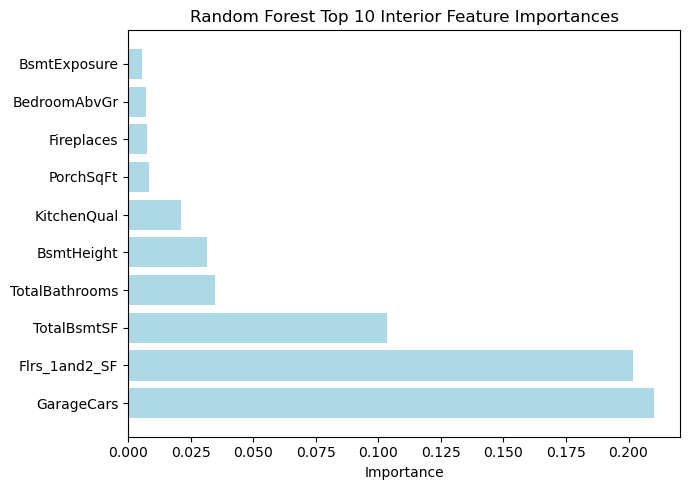

In [2185]:
import matplotlib.pyplot as plt
# RANDOM FOREST - horizontal bar plot to show interior feature importances in descending order of importance
plt.figure(figsize=(7, 5))
plt.barh(RF_interior_df_top10['Feature'], RF_interior_df_top10['Importance'], color='lightblue')
plt.xlabel('Importance')
plt.title('Random Forest Top 10 Interior Feature Importances')
plt.tight_layout()
plt.show()

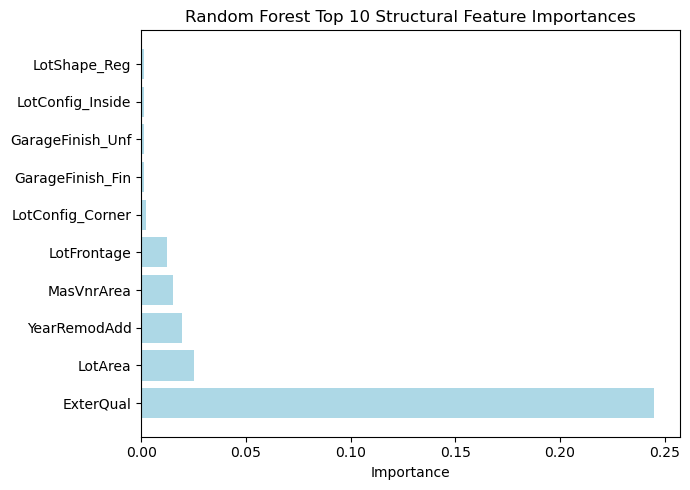

In [2186]:
# RF - horizontal bar plot to show structural feature importances in descending order of importance
plt.figure(figsize=(7, 5))
plt.barh(RF_structural_df_top10['Feature'], RF_structural_df_top10['Importance'], color='lightblue')
plt.xlabel('Importance')
plt.title('Random Forest Top 10 Structural Feature Importances')
plt.tight_layout()
plt.show()

In [2187]:
rf_avg_importance_sorted = rf_avg_importance.sort_values(ascending=False)
RF_importances_df = rf_avg_importance_sorted.reset_index()
RF_importances_df.columns = ['Feature', 'Importance']

RF_importances_df_top10 = RF_importances_df.head(10)
RF_importances_df_top10

,Feature,Importance
0,ExterQual,0.245083
1,GarageCars,0.210056
2,Flrs_1and2_SF,0.201931
3,TotalBsmtSF,0.103650
4,TotalBathrooms,0.034589
5,BsmtHeight,0.031353
6,LotArea,0.025355
7,KitchenQual,0.021059
8,YearRemodAdd,0.019582
9,MasVnrArea,0.015350


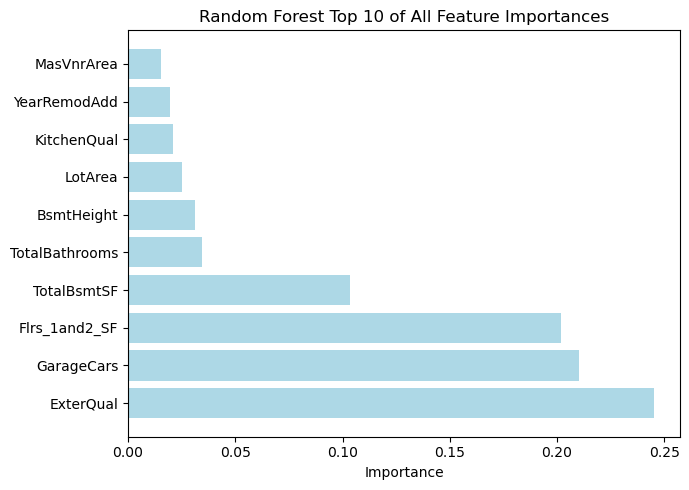

In [2188]:
plt.figure(figsize=(7, 5))
plt.barh(RF_importances_df_top10['Feature'], RF_importances_df_top10['Importance'], color='lightblue')
plt.xlabel('Importance')
plt.title('Random Forest Top 10 of All Feature Importances')
plt.tight_layout()
plt.show()

In [2129]:
#getting sum of random forest feature importances from all folds, grouped by interior vs structural features
interior_total = rf_df[interior_fts].sum(axis=1)
structural_total = rf_df[structural_fts].sum(axis=1)
print(interior_total)
print(structural_total)

0    0.602005
1    0.515557
2    0.712266
3    0.671937
4    0.621857
dtype: float64
0    0.387741
1    0.472298
2    0.277890
3    0.318441
4    0.365870
dtype: float64


In [1982]:
#adjusting interior feature to test significant difference between groups by removing dominant AllFlrsSF feature
dominant_feature = 'ExterQual'
adjusted_struct_feats = [f for f in structural_fts if f != dominant_feature]

strct_total_no_dom = rf_df[adjusted_struct_feats].sum(axis=1)
print(strct_total_no_dom)

0    0.138149
1    0.126536
2    0.104495
3    0.113743
4    0.134708
dtype: float64


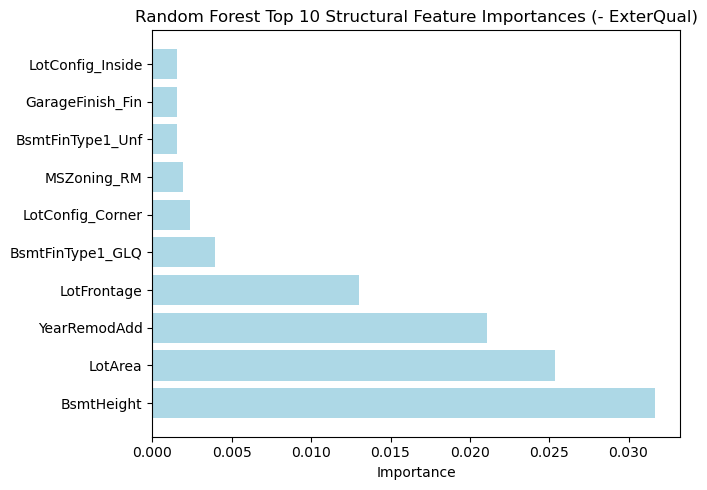

In [1983]:
strct_total_no_dom = rf_df[adjusted_struct_feats]
strct_minus_ExterQual = strct_total_no_dom.mean().sort_values(ascending=False)

strct_minus_ExterQual_df = strct_minus_ExterQual.reset_index()
strct_minus_ExterQual_df.columns = ['Feature', 'Importance']
strct_minus_ExterQual_top10 = strct_minus_ExterQual_df.head(10)

plt.figure(figsize=(7, 5))
plt.barh(strct_minus_ExterQual_top10['Feature'], strct_minus_ExterQual_top10['Importance'], color='lightblue')
plt.xlabel('Importance')
plt.title('Random Forest Top 10 Structural Feature Importances (- ExterQual)')
plt.tight_layout()
plt.show()

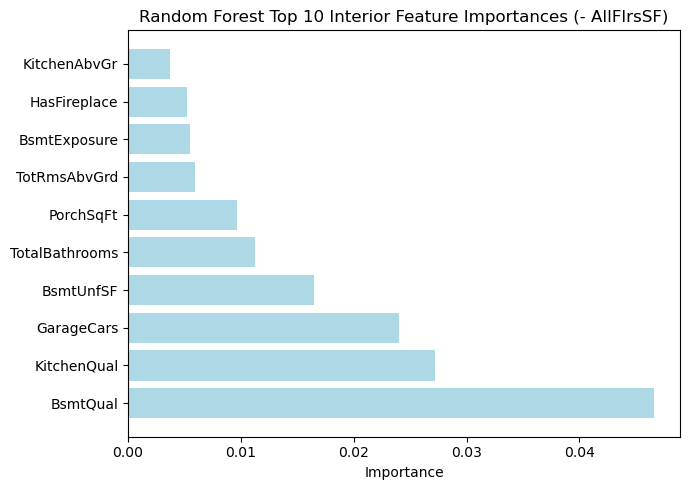

In [1335]:
interior_total_no_dom = rf_df[adjusted_interior_feats]
interior_minus_allFlrs = interior_total_no_dom.mean().sort_values(ascending=False)

interior_minus_allFlrs_df = interior_minus_allFlrs.reset_index()
interior_minus_allFlrs_df.columns = ['Feature', 'Importance']
interior_minus_allFlrs_top10 = interior_minus_allFlrs_df.head(10)

plt.figure(figsize=(7, 5))
plt.barh(interior_minus_allFlrs_top10['Feature'], interior_minus_allFlrs_top10['Importance'], color='lightblue')
plt.xlabel('Importance')
plt.title('Random Forest Top 10 Interior Feature Importances (- AllFlrsSF)')
plt.tight_layout()
plt.show()